<a href="https://colab.research.google.com/github/ryorod/meta-generative-art_dcgan/blob/master/dcgan_tpu_500epoch_p5js/dcgan_p5js.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('./drive')

In [ ]:
# 初回実行時のみ
# !mv drive/MyDrive/neort_dataset/ drive/MyDrive/1/
# !mkdir drive/MyDrive/neort_dataset/
# !mv drive/MyDrive/1/ drive/MyDrive/neort_dataset/

In [ ]:
# 初回実行時のみ
# import os
# import shutil
# import glob

# path = './drive/MyDrive/neort_dataset_p5js/1'
# os.makedirs(path, exist_ok=True)
# for p in glob.glob('./drive/MyDrive/neort_dataset/1/p5js*.png'):
#   shutil.copy(p, path)
# for p in glob.glob('./drive/MyDrive/neort_dataset/1/processing*.png'):
#   shutil.copy(p, path)

In [ ]:
# 参考: https://colab.research.google.com/github/pytorch/xla/blob/master/contrib/colab/DC-GAN.ipynb
#       https://colab.research.google.com/github/YutaroOgawa/pytorch_tutorials_jp/blob/main/notebook/2_Image_Video/2_4_dcgan_faces_tutorial_jp.ipynb
#       https://github.com/mit-han-lab/data-efficient-gans

In [ ]:
import os
assert os.environ['COLAB_TPU_ADDR'], 'Make sure to select TPU from Edit > Notebook settings > Hardware accelerator'

In [ ]:
VERSION = "nightly"  #@param ["1.5" , "20200325", "nightly"]
!curl https://raw.githubusercontent.com/pytorch/xla/master/contrib/scripts/env-setup.py -o pytorch-xla-env-setup.py
!python pytorch-xla-env-setup.py --version $VERSION

In [ ]:
!curl https://raw.githubusercontent.com/mit-han-lab/data-efficient-gans/master/DiffAugment_pytorch.py -o DiffAugment_pytorch.py

In [ ]:
from __future__ import print_function
import argparse
import os
import random
import torch
from torch import nn, optim
from torchvision import transforms, datasets
from torch.optim import Adam
import torch.nn.functional as F
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import torch_xla
import torch_xla.core.xla_model as xm
import torch_xla.debug.metrics as met
import torch_xla.distributed.parallel_loader as pl
import torch_xla.distributed.xla_multiprocessing as xmp
import torch_xla.utils.utils as xu

from DiffAugment_pytorch import DiffAugment


# 再現性のためにrandom seedを設定する
manualSeed = 999
#manualSeed = random.randint(1, 10000) # 新たな結果を得たい場合に使用する
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [ ]:
# Define Parameters
FLAGS = {}
FLAGS['datadir'] = "drive/MyDrive/neort_dataset_p5js/"
FLAGS['batch_size'] = 32
FLAGS['num_workers'] = 2
FLAGS['gen_learning_rate'] = 2e-4
FLAGS['disc_learning_rate'] = 1e-5
FLAGS['num_epochs'] = 500
FLAGS['num_cores'] = 1
FLAGS['image_size'] = 64

# 訓練画像のチャンネル数。カラー画像の場合は3。
nc = 3

# 潜在ベクトルzのサイズ (すなわち,、生成器に入力されるベクトルのサイズ)
nz = 100

# 生成器を伝播する特徴マップのサイズ
ngf = 64

# 識別器を伝播する特徴量マップのサイズ
ndf = 64

In [ ]:
def get_data():
  dataset = datasets.ImageFolder(root=FLAGS['datadir'],
                            transform=transforms.Compose([
                                transforms.Resize(FLAGS['image_size']),
                                transforms.CenterCrop(FLAGS['image_size']),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                            ]))
  return dataset

In [ ]:
# 生成器コード

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # 入力値はZで、畳み込みが適用されます
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # サイズ：(ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # サイズ：(ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # サイズ：(ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # サイズ：(ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # サイズ： (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # 入力は (NC) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # サイズ：(ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # サイズ： (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # サイズ：(ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # サイズ： (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
SERIAL_EXEC = xmp.MpSerialExecutor()
# Only instantiate model weights once in memory.
generator = Generator()
generator.apply(weights_init)
discriminator = Discriminator()
discriminator.apply(weights_init)
print(generator)
print(discriminator)
WRAPPED_GENERATOR = xmp.MpModelWrapper(generator)
WRAPPED_DISCRIMINATOR = xmp.MpModelWrapper(discriminator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


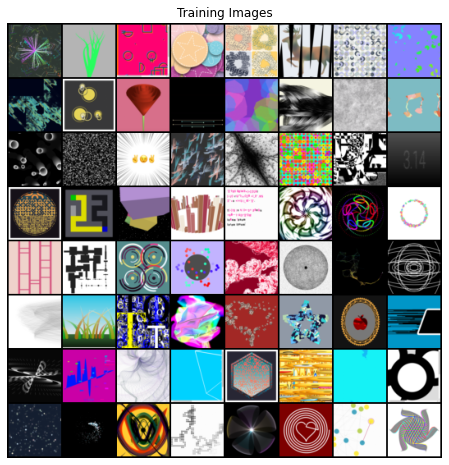

In [ ]:
data = get_data()
train_sampler = torch.utils.data.distributed.DistributedSampler(
      data,
      num_replicas=xm.xrt_world_size(),
      rank=xm.get_ordinal(),
      shuffle=True)
    

# Create loader with data, so that we can iterate over it
train_loader = torch.utils.data.DataLoader(
    data,
    batch_size=FLAGS['batch_size'],
    sampler=train_sampler,
    num_workers=FLAGS['num_workers'],
    drop_last=True)
  

device = xm.xla_device()

# トレーニング画像をプロット
tmp = train_loader.__iter__()
real_batch = tmp.next()
real_batch_2 = tmp.next()
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(torch.cat((real_batch[0],real_batch_2[0]),0).to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
# 訓練の進捗状況を把握するためのリスト
img_list = []
G_losses = []
D_losses = []

def train(rank):
  data = SERIAL_EXEC.run(lambda: get_data())
  train_sampler = torch.utils.data.distributed.DistributedSampler(
      data,
      num_replicas=xm.xrt_world_size(),
      rank=xm.get_ordinal(),
      shuffle=True)
    

  # Create loader with data, so that we can iterate over it
  train_loader = torch.utils.data.DataLoader(
    data,
    batch_size=FLAGS['batch_size'],
    sampler=train_sampler,
    num_workers=FLAGS['num_workers'],
    drop_last=True)
  

  device = xm.xla_device()

  generator = WRAPPED_GENERATOR.to(device)
  discriminator = WRAPPED_DISCRIMINATOR.to(device)

  # BCELoss関数の初期化
  criterion = nn.BCELoss()

  # 生成器の訓練の進行状況を可視化するために使用する潜在ベクトルのバッチを作成
  fixed_noise = torch.randn(64, nz, 1, 1, device=device)

  # 訓練中に利用する本物と偽物のラベルを設定
  real_label = 1.
  fake_label = 0.

  # GとDの両方にオプティマイザ：Adamを設定する
  optimizerD = Adam(discriminator.parameters(), lr=FLAGS['disc_learning_rate'], betas=(0.1, 0.999))
  optimizerG = Adam(generator.parameters(), lr=FLAGS['gen_learning_rate'], betas=(0.5, 0.999))

  num_epochs = FLAGS['num_epochs']

  policy = 'color,translation,cutout'



  # 訓練のループ

  iters = 0

  print("Starting Training Loop...")
  # 各エポックについて
  for epoch in range(num_epochs):
      # dataloader内の各バッチについて
      for i, data in enumerate(pl.MpDeviceLoader(train_loader, device)):
        
          ############################
          #  (1) 識別器Dのネットワーク更新: maximize log(D(x)+ log(1 - D(G(z)) )
          ###########################
          ## 本物画像のバッチを使った訓練
          discriminator.zero_grad()
          # バッチの形式をランタイムに合わせる
          real_cpu = data[0].to(device)
          b_size = real_cpu.size(0)
          label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
          # 本物画像のバッチをDに順伝播させる
          output = discriminator(DiffAugment(real_cpu, policy=policy)).view(-1)
          # 全ての本物画像のバッチの損失を計算する
          errD_real = criterion(output, label)
          # 逆伝播で勾配を計算する
          errD_real.backward()
          D_x = output.mean().item()

          ## 偽物画像のバッチを使った訓練
          # 潜在ベクトルのバッチを生成
          noise = torch.randn(b_size, nz, 1, 1, device=device)
          # Gを使って、偽画像のバッチを生成
          fake = generator(noise)
          label.fill_(fake_label)
          # Dを使って、全ての偽画像を分類
          output = discriminator(DiffAugment(fake.detach(), policy=policy)).view(-1)
          # 全ての偽画像に対するDの損失を計算
          errD_fake = criterion(output, label)
          # 偽画像に対する勾配を計算
          errD_fake.backward()
          D_G_z1 = output.mean().item()
          # 全ての本物画像のバッチの勾配と、全ての偽画像のバッチの勾配を足す
          errD = errD_real + errD_fake
          # Dのパラメータを更新
          xm.optimizer_step(optimizerD)

          ############################
          # (2) 生成器Gのネットワークを更新: maximize log(D(G(z)))
          ###########################
          generator.zero_grad()
          label.fill_(real_label)  # 生成器の損失にとっては、偽画像ラベルが正解になる
          # ちょうど識別器Dを更新したので、偽画像バッチをもう一度識別器Dに順伝播させる
          output = discriminator(DiffAugment(fake, policy=policy)).view(-1)
          # この出力に対するGの損失をもう一度計算
          errG = criterion(output, label)
          # Gの勾配を計算
          errG.backward()
          D_G_z2 = output.mean().item()
          # Gを更新
          xm.optimizer_step(optimizerG)
        
          # 訓練のステータスを出力
          if i % 25 == 0:
              xm.master_print('[{}/{}][{}/{}]\tLoss_D: {}\tLoss_G: {}\tD(x): {}\tD(G(z)): {} / {}'
                    .format(epoch, num_epochs, i, len(train_loader),
                      errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
          # あとでプロットするために損失を保存
          G_losses.append(errG.item())
          D_losses.append(errD.item())
        
          # 生成器Gの出力をfixed_noiseに保存して、生成器の動作を確認
          if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
              with torch.no_grad():
                fake = generator(fixed_noise).detach().cpu()
              img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
          iters += 1

In [ ]:
# Start training processes
def _mp_fn(rank, flags):
    global FLAGS
    FLAGS = flags
    torch.set_default_tensor_type('torch.FloatTensor')
    train(rank)

xmp.spawn(_mp_fn, args=(FLAGS,), nprocs=FLAGS['num_cores'],
          start_method='fork')


os.makedirs("./drive/MyDrive/meta-generative-art_dcgan/dcgan_tpu_500epoch_p5js/models", exist_ok=True)
xm.save(generator.state_dict(), "./drive/MyDrive/meta-generative-art_dcgan/dcgan_tpu_500epoch_p5js/models/generator_p5js_meta-generative-art_dcgan.pth")
xm.save(discriminator.state_dict(), "./drive/MyDrive/meta-generative-art_dcgan/dcgan_tpu_500epoch_p5js/models/discriminator_p5js_meta-generative-art_dcgan.pth")

Starting Training Loop...
[0/500][0/20]	Loss_D: 1.5996344089508057	Loss_G: 1.1572020053863525	D(x): 0.36748576164245605	D(G(z)): 0.3282524645328522 / 0.36818578839302063
[1/500][0/20]	Loss_D: 1.4241464138031006	Loss_G: 0.8329702019691467	D(x): 0.5242549777030945	D(G(z)): 0.47109177708625793 / 0.4942193925380707
[2/500][0/20]	Loss_D: 1.3445913791656494	Loss_G: 0.9340271353721619	D(x): 0.6012775301933289	D(G(z)): 0.4788808822631836 / 0.4286029636859894
[3/500][0/20]	Loss_D: 1.4160540103912354	Loss_G: 0.8375713229179382	D(x): 0.5058484077453613	D(G(z)): 0.4263039827346802 / 0.5006411075592041
[4/500][0/20]	Loss_D: 1.353588581085205	Loss_G: 0.833892285823822	D(x): 0.4960107207298279	D(G(z)): 0.397318571805954 / 0.4787495732307434
[5/500][0/20]	Loss_D: 1.35146164894104	Loss_G: 0.8964130282402039	D(x): 0.5000542998313904	D(G(z)): 0.3896101713180542 / 0.4419184923171997
[6/500][0/20]	Loss_D: 1.3074495792388916	Loss_G: 1.116102933883667	D(x): 0.570019543170929	D(G(z)): 0.4624210596084595 / 0.3

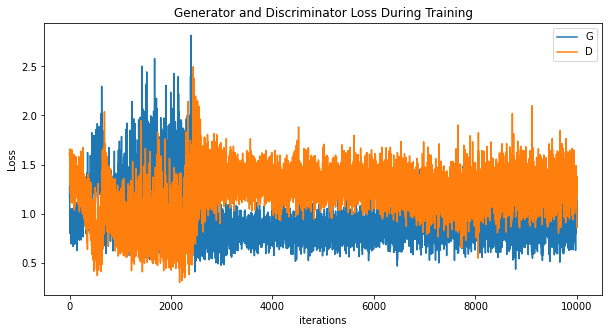

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

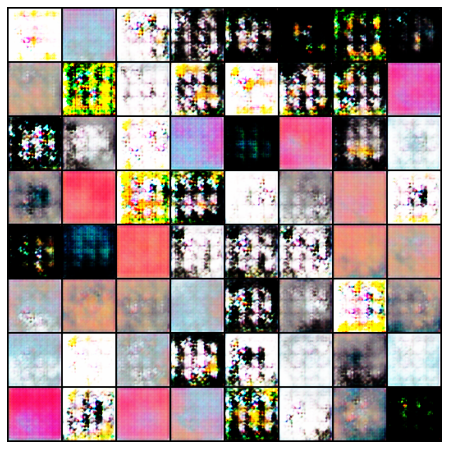

In [ ]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

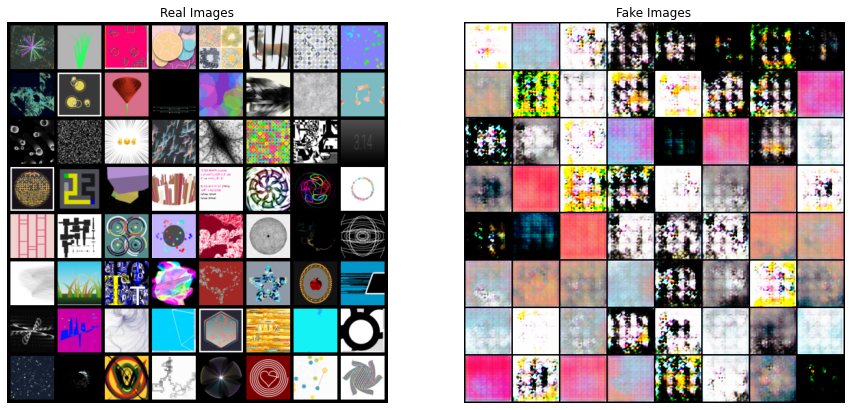

In [ ]:
# dataloaderから本物の画像を取得する
tmp = train_loader.__iter__()
real_batch = tmp.next()
real_batch_2 = tmp.next()

# 本物画像をプロット
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(torch.cat((real_batch[0],real_batch_2[0]),0).to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# 最後のエポックから偽物画像をプロットする
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()